# Introduction
In this project we aim to predict vaccination efficacy in individual adaptative immune cell clones. 

The adaptative immune cells T and B cells, are different from other cells because they have an Adaptative Immune Recetpor (AIR, or TCR and BCR respectively). The AIR is encoded by a genomic sequence that is different per every clonally different cell, and binds specifically to certain viral/cancer/pathogenic antigens. When analyzing B and T cells with single-cell sequencing, we can additionally sequence the AIR, which gives us a new modality that we analyse with specialised tools (e.g. [scirpy](https://scirpy.scverse.org/en/latest/)). Before starting please, carefully follow this [tutorial](https://www.sc-best-practices.org/air_repertoire/ir_profiling.html) to gain a good understanding of the adaptative immune cell-specific biology, tools, and analyses. 

# Imports

In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [2]:
import pandas as pd
import numpy as np
import scirpy as ir
import anndata as ad
import scanpy as sc
from matplotlib import rcParams
import matplotlib.pyplot as plt
import seaborn as sns
import os
from tqdm import tqdm

In [ ]:
sc.settings.verbosity = 0
sc.set_figure_params(vector_friendly=True, dpi_save=150)

# Load dataseet
We will start working with a T cell single cell dataset from a [Covid Vaccine study](https://www.biorxiv.org/content/10.1101/2024.10.30.620795v1.full.pdf), which investigates T cell response to covid vaccination across 29 donors. 
We can download the dataset pre-processed and with results from downstream anlyses from [zenodo](https://zenodo.org/records/13981508). It contains 53,907 cells with the measurings described below.

The study consists of three different experiments, and the measurings change a bit across them (see publication).

In [15]:
adata = sc.read_h5ad('../datasets/02_dex_annotated_cd8.h5ad')
adata

AnnData object with n_obs × n_vars = 53907 × 18471
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'LTDEMIAQY', 'YTN

In [37]:
print(adata.obs.donor.cat.categories.values)
print(adata.obs.time.cat.categories.values)
adata.obs[['donor','time','experiment']].head(3)

['A02' 'A03' 'A04' 'A05' 'A06' 'A07' 'A08' 'A11' 'A15' 'A16' 'A19' 'A25'
 'A29' 'HIM']
['P1' 'S1' 'S2' 'S3' 'T1' 'T2' 'T3' 'X3' 'extra']


,donor,time,experiment
AAACCTGAGTGTTGAA-1-initial-0-0,A15,S2,first_experiment
AAACCTGCACCAGGCT-1-initial-0-0,A29,S2,first_experiment
AAACCTGCATACGCTA-1-initial-0-0,A15,S2,first_experiment


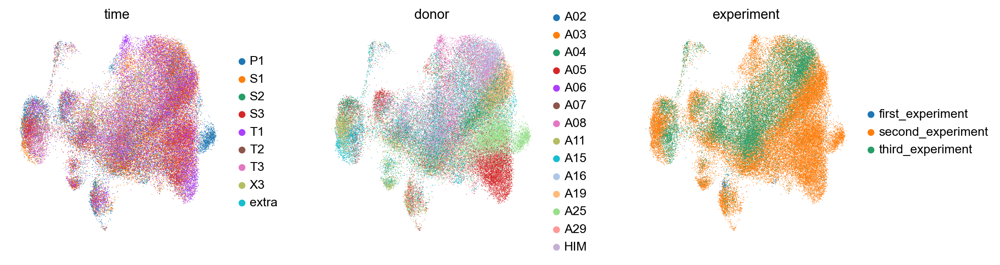

In [38]:
sc.pl.umap(adata, color=['time','donor','experiment'], frameon=False, wspace=0.3, size=2)

#### RNAseq measurings
processed with scanpy and stored as a sparse matrix of log normalized counts in adata.X

In [18]:
adata.X

<53907x18471 sparse matrix of type '<class 'numpy.float32'>'
	with 76006720 stored elements in Compressed Sparse Row format>

In [27]:
adata.X[0:5,6:12].A

array([[0.       , 1.3098526, 0.       , 0.       , 0.       , 2.4700055],
       [1.4968079, 0.       , 0.       , 0.       , 0.       , 0.       ],
       [0.       , 0.       , 0.       , 0.       , 0.       , 3.1313903],
       [1.5347866, 0.       , 0.       , 0.       , 0.       , 0.       ],
       [0.       , 0.       , 0.       , 0.       , 0.       , 0.       ]],
      dtype=float32)

Additionally, we have a set of scores and embeddings derived from the transcriptome:
* Embeddings stored in obsm (X_diffmap and X_umap).
* Scores that measure the per-cell aggregated expression of groups of genes with a role in the same biological process or characteristic of particular cell-types (to help with the annotations and analyses; stored in obs). IFN Response score is particular important, since it reflects that a T cell has been activated.
* Pseudotime score to temporally order the cells (dpt_pseudotime, stored in obs).

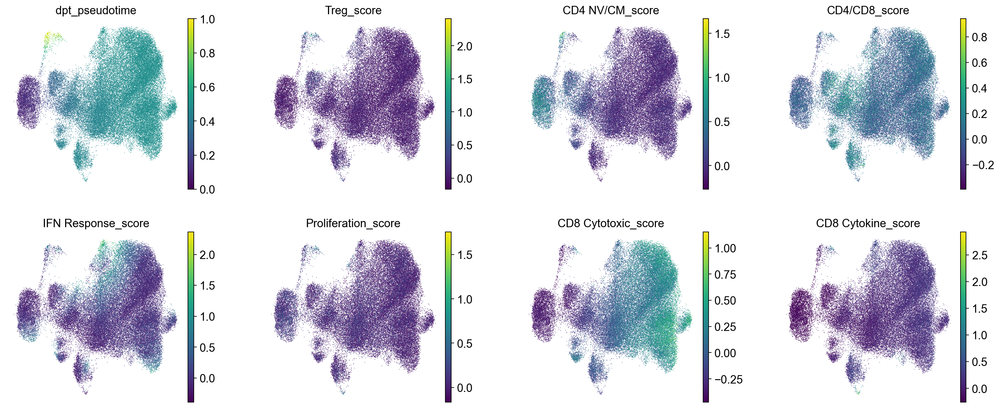

In [45]:
sc.pl.umap(adata, frameon=False, wspace=0.3, size=2, cmap='viridis',
           color=['dpt_pseudotime', 'Treg_score', 'CD4 NV/CM_score', 'CD4/CD8_score', 'IFN Response_score', 'Proliferation_score', 'CD8 Cytotoxic_score', 'CD8 Cytokine_score'], )


#### CITEseq markers
processed with scanpy and stored unormalized and CLR-normalized in obs (Hu.<protein_name> and clr_Hu.<protein_name>). This is not available for all experiments.


In [50]:
adata.obs.loc[~adata.obs['Hu.CD101'].isna(),adata.obs.columns.str.contains('Hu')].head(3)

,Hu.CD101,Hu.CD103,Hu.CD105_43A3,Hu.CD107a,Hu.CD112,Hu.CD119,Hu.CD11a,Hu.CD11b,Hu.CD11c,Hu.CD122,...,clr_Hu.KLRG1,clr_Hu.LOX.1,clr_Hu.TCR.AB,clr_Hu.TCR.Va7.2,clr_Hu.TCR.Vd2,clr_Hu.TIGIT,clr_HuMs.CD44,clr_HuMs.CD49f,clr_HuMs.integrin.b7,clr_HuMsRt.CD278
AAACCTGAGATTACCC-1-0-1,40.0,2.0,8.0,6.0,11.0,8.0,91.0,1.0,0.0,12.0,...,1.119436,0.949018,0.845765,0.000000,0.758230,1.029531,0.631626,0.298681,0.890880,0.644218
AAACCTGAGGTCGGAT-1-0-1,5.0,2.0,4.0,1.0,6.0,5.0,121.0,2.0,0.0,10.0,...,1.649735,0.583101,0.565236,2.431852,0.000000,1.927583,0.971250,0.403634,0.862397,0.612044
AAACCTGCATTCCTCG-1-0-1,46.0,8.0,10.0,7.0,7.0,8.0,32.0,2.0,0.0,8.0,...,0.275663,0.583101,0.667741,0.738419,0.993897,0.666412,0.859098,0.690399,1.546679,1.191311


In [49]:
# list of available protein markers
np.sort(adata.obs.columns[adata.obs.columns.str.contains('clr_')].values)

array(['clr_CCR7', 'clr_CD45RA', 'clr_CD62L', 'clr_CXCR3', 'clr_Hu.CD101',
       'clr_Hu.CD103', 'clr_Hu.CD105_43A3', 'clr_Hu.CD107a',
       'clr_Hu.CD112', 'clr_Hu.CD119', 'clr_Hu.CD11a', 'clr_Hu.CD11b',
       'clr_Hu.CD11c', 'clr_Hu.CD122', 'clr_Hu.CD123', 'clr_Hu.CD124',
       'clr_Hu.CD127', 'clr_Hu.CD13', 'clr_Hu.CD134', 'clr_Hu.CD137',
       'clr_Hu.CD141', 'clr_Hu.CD146', 'clr_Hu.CD14_M5E2', 'clr_Hu.CD152',
       'clr_Hu.CD154', 'clr_Hu.CD155', 'clr_Hu.CD158', 'clr_Hu.CD158b',
       'clr_Hu.CD158e1', 'clr_Hu.CD16', 'clr_Hu.CD161', 'clr_Hu.CD163',
       'clr_Hu.CD169', 'clr_Hu.CD18', 'clr_Hu.CD183', 'clr_Hu.CD185',
       'clr_Hu.CD19', 'clr_Hu.CD194', 'clr_Hu.CD195', 'clr_Hu.CD196',
       'clr_Hu.CD1c', 'clr_Hu.CD1d', 'clr_Hu.CD2', 'clr_Hu.CD20_2H7',
       'clr_Hu.CD21', 'clr_Hu.CD22', 'clr_Hu.CD223', 'clr_Hu.CD224',
       'clr_Hu.CD226_11A8', 'clr_Hu.CD23', 'clr_Hu.CD24', 'clr_Hu.CD244',
       'clr_Hu.CD25', 'clr_Hu.CD26', 'clr_Hu.CD267', 'clr_Hu.CD268',
       'clr

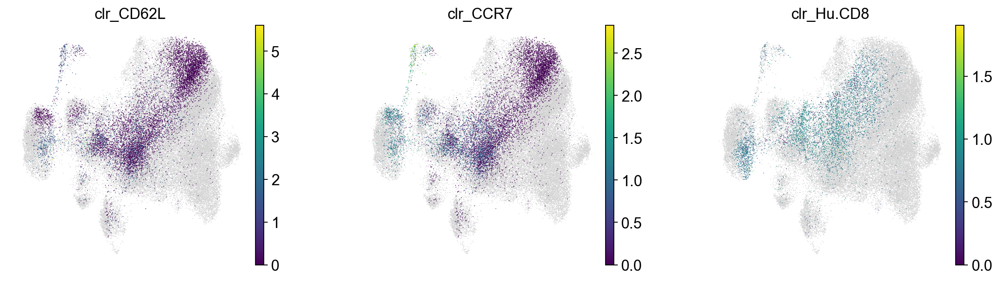

In [52]:
sc.pl.umap(adata, frameon=False, wspace=0.3, size=2, cmap='viridis', color=['clr_CD62L','clr_CCR7','clr_Hu.CD8'])


#### TCR annotations
Using scirpy, we can process the T cell repertoires. We can identify for each gene segment (2x C,V,D,J for alpha-VJ and beta-VDJ chain) which gene is used, and the genetic sequence of the CDR3. We can define clones based on identical CDR3 sequence on both the alpha and the beta chain, and define clone size based on the number of cells that have that sequence.

In [67]:
# These are the most important variables, which are derived from the actual sequences and gene segments, stored in the variables below
adata.obs[['has_ir', 'receptor_type', 'receptor_subtype', 'chain_pairing', 'clone_id', 'clone_id_size', 'clone_size_clipped', 'clone_size', 'clone_size_sample', 'clone_size_donor', 'clonotype_sequence', 'v_genes', 'j_genes']].head(3)


,has_ir,receptor_type,receptor_subtype,chain_pairing,clone_id,clone_id_size,clone_size_clipped,clone_size,clone_size_sample,clone_size_donor,clonotype_sequence,v_genes,j_genes
AAACCTGAGTGTTGAA-1-initial-0-0,True,TCR,TRA+TRB,single pair,0.0,1,1,1.0,1.0,1.0,CIAPLIPRVTF CASSHVSPYTEAFF,TRAV26-1 TRBV4-1,TRAJ13 TRBJ1-1
AAACCTGCACCAGGCT-1-initial-0-0,True,TCR,TRA+TRB,single pair,1.0,1,1,1.0,1.0,1.0,CAVGASFGNEKLTF CASSTIRQGSNTFF,TRAV8-3 TRBV5-8,TRAJ48 TRBJ1-1
AAACCTGCATACGCTA-1-initial-0-0,True,TCR,TRA+TRB,single pair,2.0,12,>= 3,1.0,1.0,12.0,CAASETGGGADGLTF CASSPGYEQYF,TRAV13-1 TRBV18,TRAJ45 TRBJ2-7


In [59]:
adata.obs.iloc[:,2:22].head(3)

,multi_chain,extra_chains,IR_VJ_1_c_call,IR_VJ_2_c_call,IR_VDJ_1_c_call,IR_VDJ_2_c_call,IR_VJ_1_consensus_count,IR_VJ_2_consensus_count,IR_VDJ_1_consensus_count,IR_VDJ_2_consensus_count,IR_VJ_1_d_call,IR_VJ_2_d_call,IR_VDJ_1_d_call,IR_VDJ_2_d_call,IR_VJ_1_duplicate_count,IR_VJ_2_duplicate_count,IR_VDJ_1_duplicate_count,IR_VDJ_2_duplicate_count,IR_VJ_1_j_call,IR_VJ_2_j_call
AAACCTGAGTGTTGAA-1-initial-0-0,False,[],TRAC,NaN,TRBC1,NaN,396.0,NaN,33122.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,16.0,NaN,TRAJ13,NaN
AAACCTGCACCAGGCT-1-initial-0-0,False,[],TRAC,NaN,TRBC1,NaN,6164.0,NaN,7354.0,NaN,NaN,NaN,NaN,NaN,2.0,NaN,5.0,NaN,TRAJ48,NaN
AAACCTGCATACGCTA-1-initial-0-0,False,[],TRAC,NaN,TRBC2,NaN,5506.0,NaN,63300.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,38.0,NaN,TRAJ45,NaN


In [60]:
adata.obs.iloc[:,22:42].head(3)

,IR_VDJ_1_j_call,IR_VDJ_2_j_call,IR_VJ_1_junction,IR_VJ_2_junction,IR_VDJ_1_junction,IR_VDJ_2_junction,IR_VJ_1_junction_aa,IR_VJ_2_junction_aa,IR_VDJ_1_junction_aa,IR_VDJ_2_junction_aa,IR_VJ_1_locus,IR_VJ_2_locus,IR_VDJ_1_locus,IR_VDJ_2_locus,IR_VJ_1_productive,IR_VJ_2_productive,IR_VDJ_1_productive,IR_VDJ_2_productive,IR_VJ_1_v_call,IR_VJ_2_v_call
AAACCTGAGTGTTGAA-1-initial-0-0,TRBJ1-1,NaN,TGCATCGCCCCCTTGATCCCCAGAGTTACCTTT,NaN,TGCGCCAGCAGCCACGTTAGTCCCTACACTGAAGCTTTCTTT,NaN,CIAPLIPRVTF,NaN,CASSHVSPYTEAFF,NaN,TRA,NaN,TRB,NaN,True,None,True,None,TRAV26-1,NaN
AAACCTGCACCAGGCT-1-initial-0-0,TRBJ1-1,NaN,TGTGCTGTGGGTGCTTCCTTTGGAAATGAGAAATTAACCTTT,NaN,TGTGCCAGCAGCACTATTCGACAGGGCTCCAATACTTTCTTT,NaN,CAVGASFGNEKLTF,NaN,CASSTIRQGSNTFF,NaN,TRA,NaN,TRB,NaN,True,None,True,None,TRAV8-3,NaN
AAACCTGCATACGCTA-1-initial-0-0,TRBJ2-7,NaN,TGTGCAGCAAGTGAGACAGGAGGAGGTGCTGACGGACTCACCTTT,NaN,TGTGCCAGCTCCCCGGGGTACGAGCAGTACTTC,NaN,CAASETGGGADGLTF,NaN,CASSPGYEQYF,NaN,TRA,NaN,TRB,NaN,True,None,True,None,TRAV13-1,NaN


#### Antigen binding scores
In the study, they also measured the binding of each cell to different covid epitopes (and some other virus as controls). The binding strength (number of barcodes from that eptiope detected in that cell) is in obs under each antigen column. As described in the manuscript, based on these columns specificity to one antigen is assigned. The results of this is stored under the column "binding_ct", while "is_dex+" describes whether the cell binds any covid epitope.

In [69]:
adata.obs[['binding_ct','is_dex+','LTDEMIAQY', 'YTNSFTRGVY', 'YLQPRTFLL']].head(3)

,binding_ct,is_dex+,LTDEMIAQY,YTNSFTRGVY,YLQPRTFLL
AAACCTGAGTGTTGAA-1-initial-0-0,No binding,False,0.0,0.0,0.0
AAACCTGCACCAGGCT-1-initial-0-0,No binding,False,0.0,1.0,0.0
AAACCTGCATACGCTA-1-initial-0-0,No binding,False,3.0,0.0,0.0


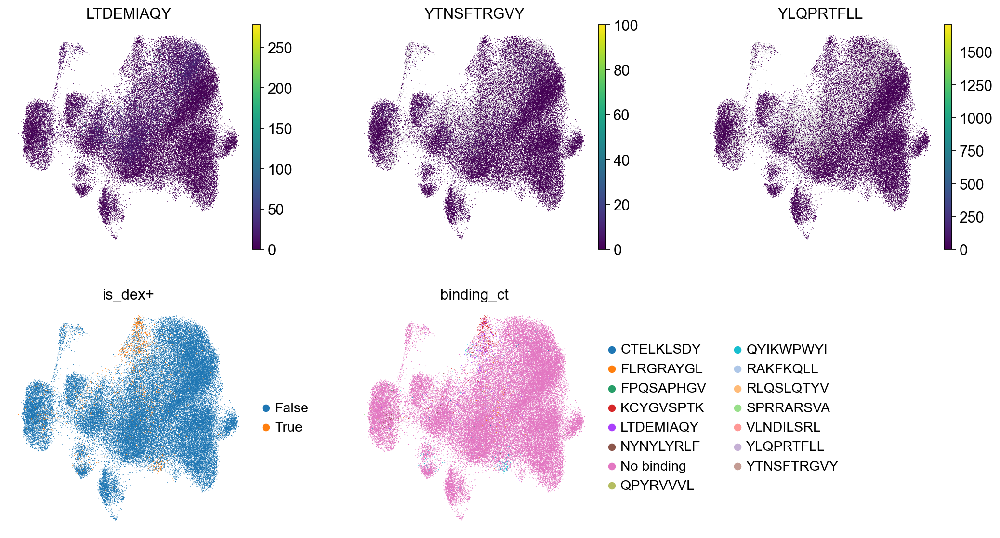

In [72]:
sc.pl.umap(adata, color=['LTDEMIAQY', 'YTNSFTRGVY', 'YLQPRTFLL','is_dex+','binding_ct'], frameon=False, wspace=0.3, size=2, ncols=3)

# Designing the objectives model
We want to predict how a clone responds to vaccination in a late time point, using data from initial time points. For this, we need to check how many clones have cells shared between each pair of time-points.


### Choosing time-points for our predictions

In [78]:
# filter out cells that we can't use
adata = adata[~adata.obs.clone_id.isna()]
adata = adata[~(adata.obs.clone_id=='nan')]
adata = adata[~(adata.obs.time.isin(['X3','extra']))]

In [76]:
clonotypes = adata.obs[['clone_id','time']].value_counts().reset_index().pivot(columns='time', index='clone_id', values='count')
clonotypes['sum']=clonotypes.sum(axis=1)
clonotypes = clonotypes.sort_values(by='sum', ascending=False)
clonotypes = clonotypes[(~clonotypes.isna()).sum(axis=1) > 2]

In [77]:
timepoints_n = pd.DataFrame([], index=clonotypes.columns[0:-1], columns=clonotypes.columns[0:-1])
for time_0 in timepoints_n.columns:
    for time_1 in timepoints_n.columns:
        df = clonotypes.loc[:,[time_0,time_1]]
        df = df[df.isna().sum(axis=1) == 0]
        timepoints_n.loc[time_0,time_1] = len(df)
timepoints_n

time,P1,S1,S2,S3,T1,T2,T3
time,,,,,,,
P1,962,673,156,557,617,120,211
S1,673,1178,178,609,770,144,294
S2,156,178,240,134,177,37,54
S3,557,609,134,926,625,70,168
T1,617,770,177,625,1156,147,310
T2,120,144,37,70,147,247,137
T3,211,294,54,168,310,137,465


It seems like the best option is using P1 data to predict response at S1 and T1. However we can train our models in different time-points combinations, or even evaluate the effect of using time as a conditional.

### Distribution of the Y-variable to be predicted
We plot the distribution of serval scores reflective of vaccine response, to decide which scores we want to predict. A good score should show different distributions across acute time-points (where we expect a big signal) and late time-points. We can also check if there are donors that seem to be more responsive.

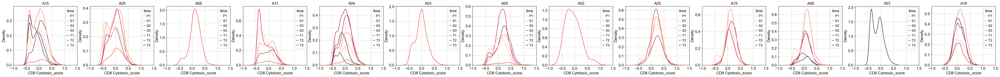

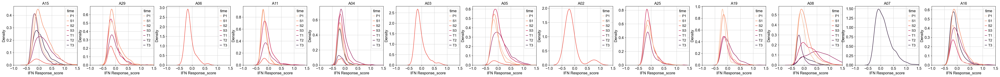

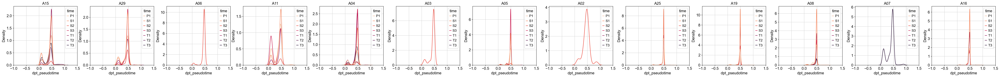

In [79]:
timepoints = adata.obs.time.cat.categories
donors = adata.obs.donor.unique()

for var in ['CD8 Cytotoxic_score','IFN Response_score','dpt_pseudotime']:
    figs, axes = plt.subplots(nrows=1, ncols=len(donors), figsize=(5*len(donors),4))
    for i, donor in enumerate(donors):
        axes[i] = sns.kdeplot(adata[(adata.obs.donor == donor)].obs[['time',var]], x=var, hue='time', ax=axes[i], palette='rocket_r', hue_order=timepoints)
        axes[i].set_xlim((-1,1.5))
        axes[i].title.set_text(donor)
        
    plt.show()

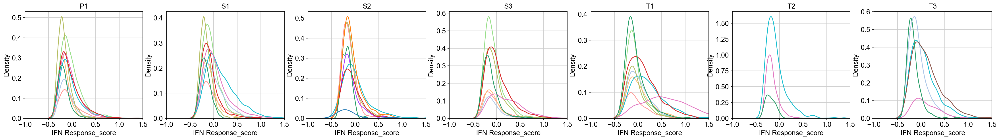

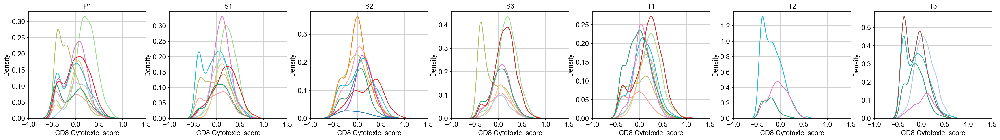

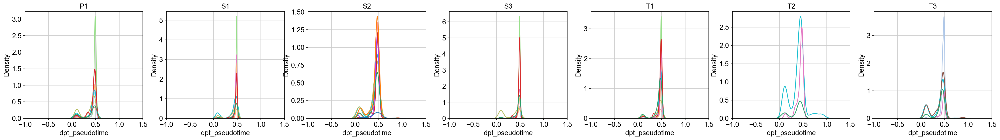

In [85]:
timepoints = adata.obs.time.cat.categories
donors = adata.obs.donor.cat.categories

for var in ['IFN Response_score','CD8 Cytotoxic_score','dpt_pseudotime']:
    figs, axes = plt.subplots(nrows=1, ncols=len(timepoints), figsize=(5*len(timepoints),4))
    for i, timepoint in enumerate(timepoints):
        axes[i] = sns.kdeplot(adata[(adata.obs.time == timepoint)].obs[['donor',var]], x=var, hue='donor', ax=axes[i], hue_order=donors)
        axes[i].set_xlim((-1,1.5))
        axes[i].title.set_text(timepoint)
        axes[i].get_legend().remove()
    plt.show()

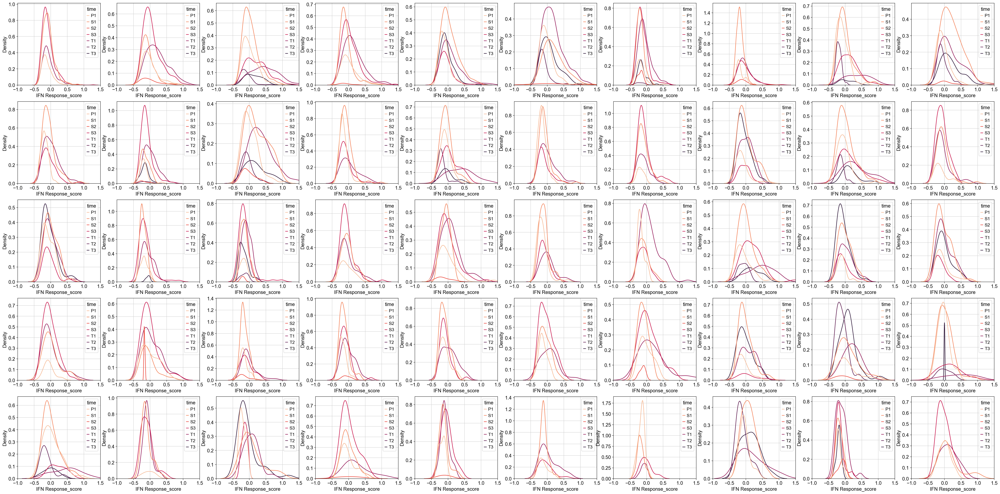

In [87]:
# here we can compare the evolution in different clones (each plot corresponds to the IFN response score distribution in a single clone, for the 50 biggest clones)
timepoints = adata.obs.time.cat.categories
expanded_clones = clonotypes.head(50).index
var = 'IFN Response_score'
figs, axes = plt.subplots(nrows=5, ncols=10, figsize=(10*5,5*5))
for i, clone in enumerate(expanded_clones):
    r = int(i/10)
    c = i - 10*r
    axes[r,c] = sns.kdeplot(adata[(adata.obs.clone_id==clone)].obs[['time',var]], x=var, hue='time', ax=axes[r,c], hue_order=timepoints, palette='rocket_r')
    axes[r,c].set_xlim((-1,1.5))        


Let's look at it aggregated. Does the IFN response vary in average across time-points?

In [89]:
clonotypes_ifn = clonotypes.iloc[:,0:-1].copy()
for clone in tqdm(clonotypes_ifn.index):
    for time in clonotypes_ifn.columns:
        clonotypes_ifn.loc[clone,time] = adata.obs.loc[(adata.obs.clone_id == clone) & (adata.obs.time == time),'IFN Response_score'].mean()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 1763/1763 [00:02<00:00, 679.49it/s]


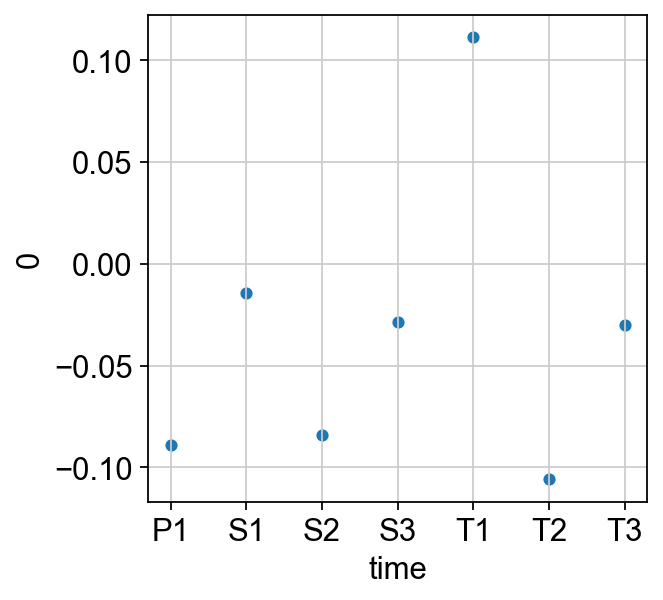

In [91]:
clonotypes_ifn['sum'] = clonotypes['sum']
clonotypes_ifn.mean(axis=0).reset_index()[0:-1].plot.scatter(x='time',y=0)
plt.show()

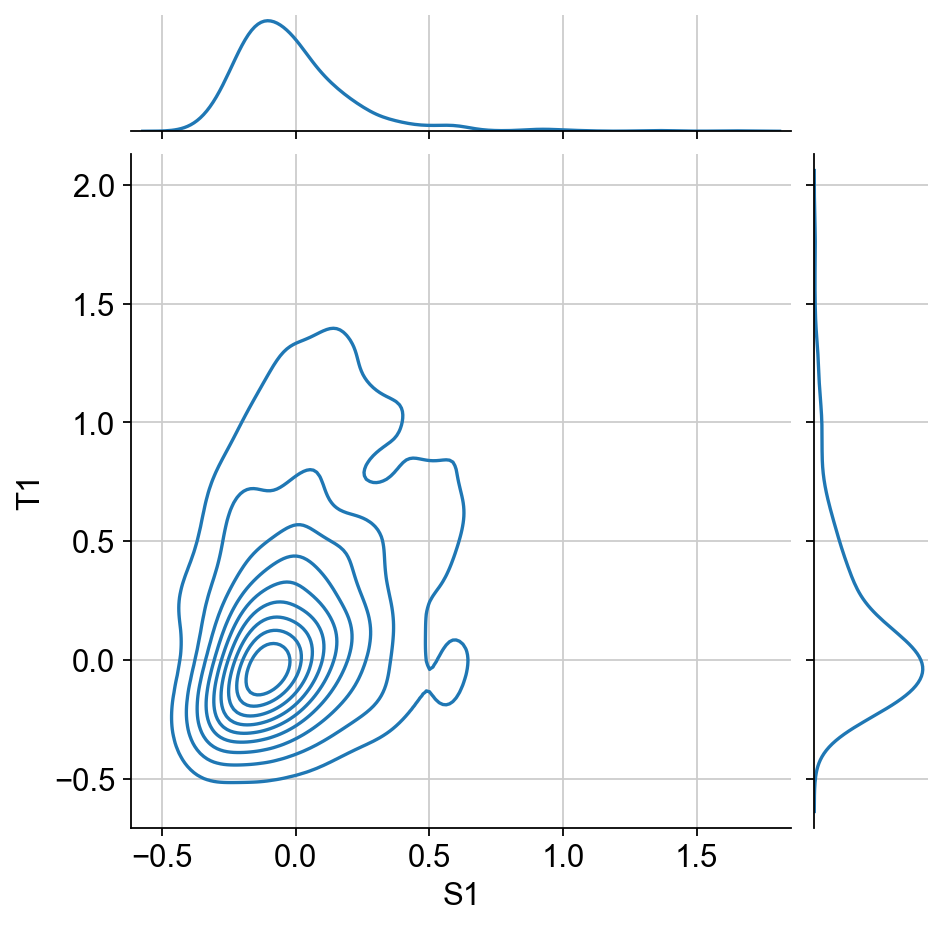

In [101]:
# How do IFN response at S1 and T1 relate?
sns.jointplot(clonotypes_ifn[(~clonotypes_ifn.T1.isna()) & (~clonotypes_ifn.S1.isna())], x='S1', y='T1', kind='kde')
plt.show()

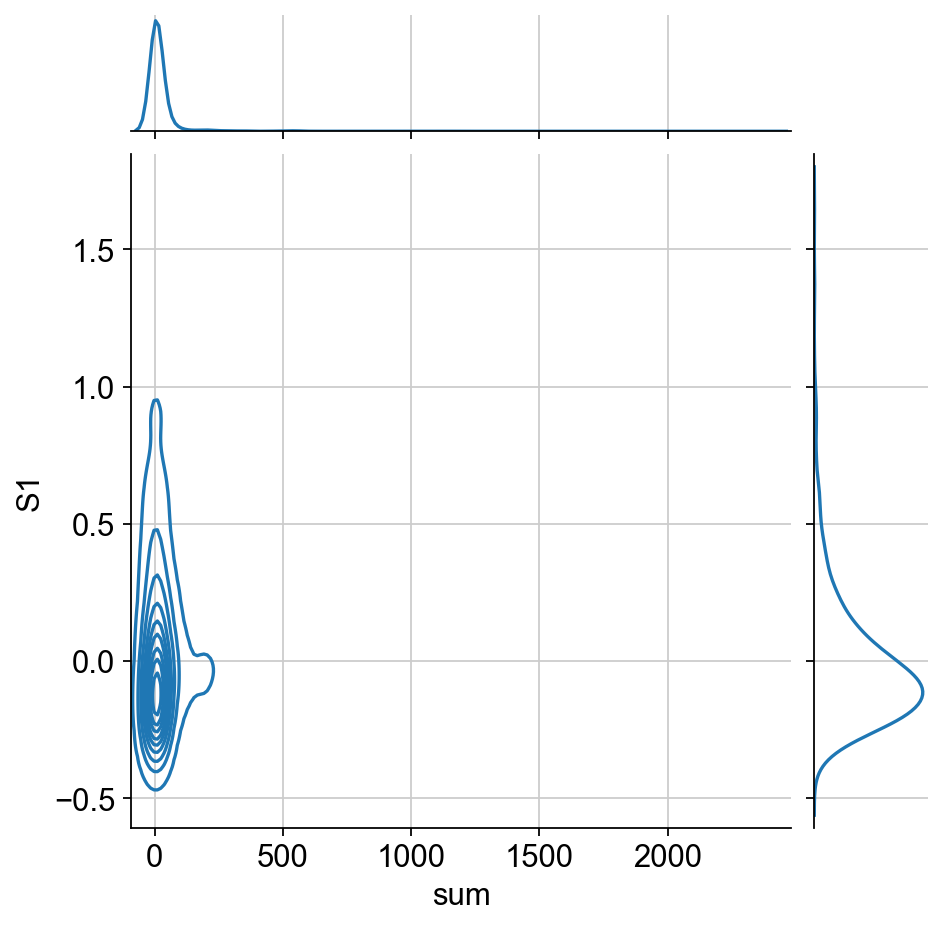

In [99]:
# How do clonotype size and IFN response at S1 relate?
sns.jointplot(clonotypes_ifn[(~clonotypes_ifn.S1.isna())], x='sum', y='S1', kind='kde')
plt.show()

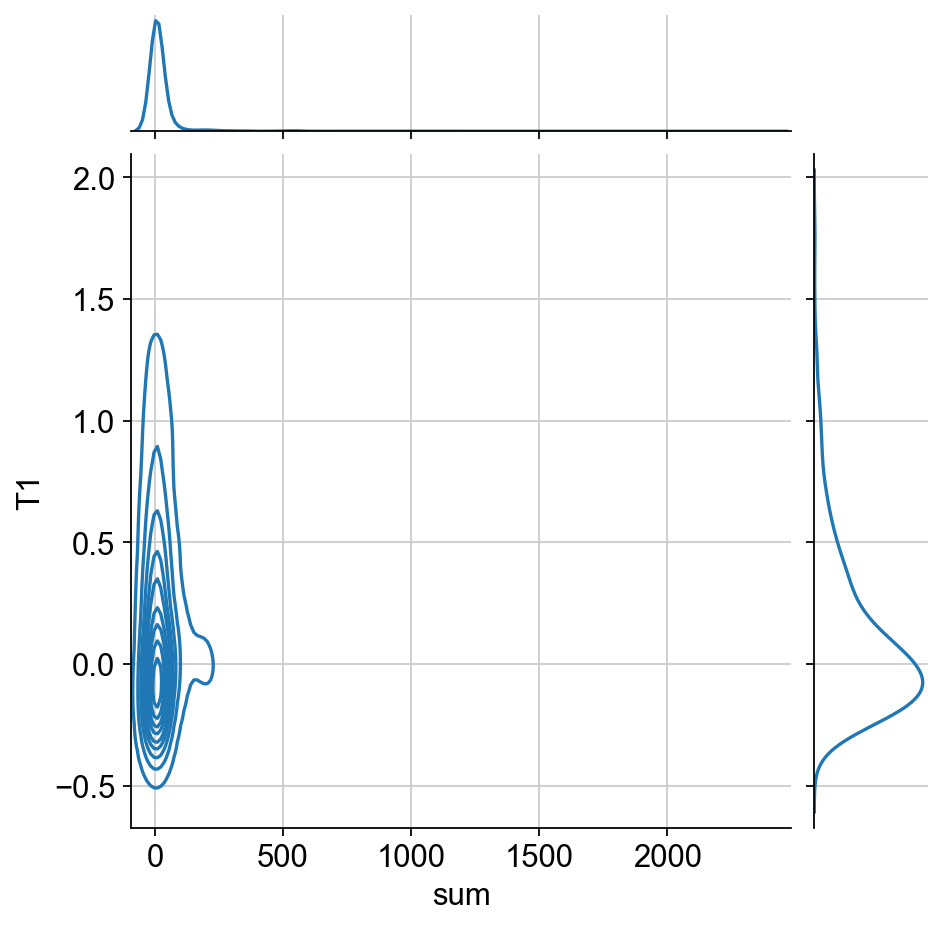

In [100]:
# How do clonotype size and IFN response at T1 relate?
sns.jointplot(clonotypes_ifn[(~clonotypes_ifn.T1.isna())], x='sum', y='T1', kind='kde')
plt.show()

Plot the distribution of the most and less responsive clones at T1

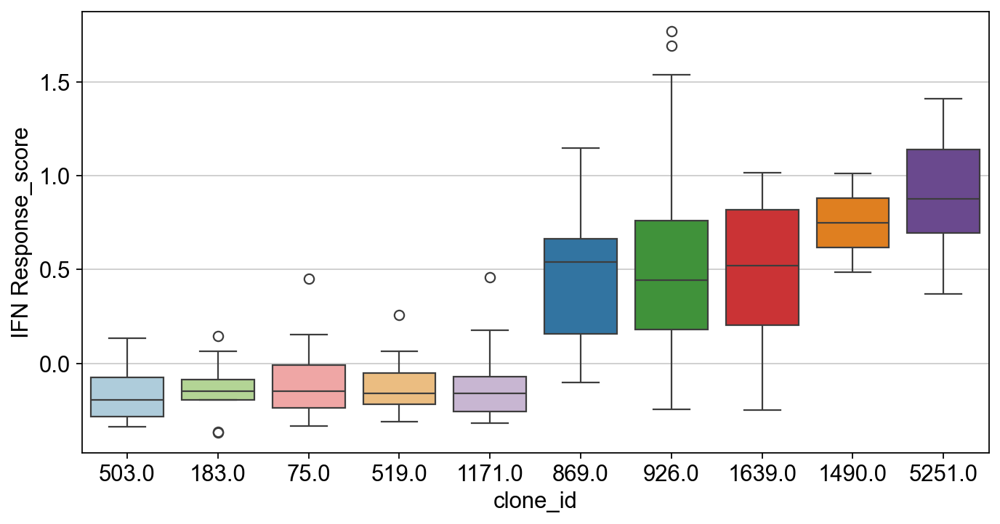

In [102]:
clones = clonotypes_ifn[(~clonotypes_ifn.T1.isna()) & (clonotypes_ifn['sum'] > 50)].sort_values(by='T1').index
clones = clones[0:5].tolist() + clones[-6:-1].tolist()
dt = adata[adata.obs.clone_id.isin(clones) & (adata.obs.time == 'T1')].obs[['clone_id','IFN Response_score']]
dt.loc[:,['clone response']] = dt['clone_id'].map({clone: ('NR' if i < 5 else 'R') for i, clone in enumerate(clones)})

rcParams['figure.figsize'] = (10, 5)
sns.boxplot(data=dt, x="clone_id", y="IFN Response_score", hue="clone_id", palette='Paired', hue_order=np.array(clones)[[0,5,1,6,2,7,3,8,4,9]], order=clones)
rcParams['figure.figsize'] = (5, 4)


And their GEX (visualised by the UMAP) in different time points.

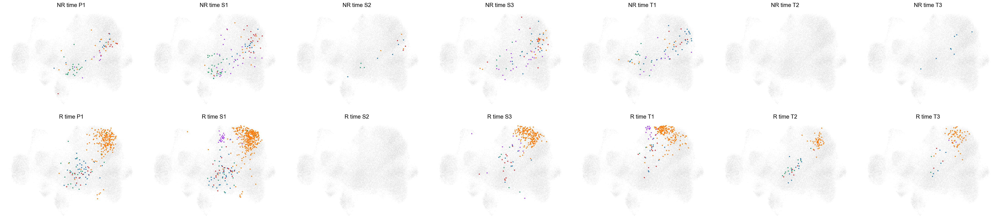

In [112]:
timepoints = clonotypes.columns[0:-1]
figs, axes = plt.subplots(nrows=2, ncols=len(timepoints), figsize=(5*len(timepoints),4*2))
    
clones_map = {'NR': [clone for i, clone in enumerate(clones) if i < 5], 'R': [clone for i, clone in enumerate(clones) if i > 4]}

for j, timepoint in enumerate(timepoints):
    ax = sc.pl.umap(adata, frameon=False, show=False, size=1, ax=axes[0,j], title='', legend_loc=None)
    ax = sc.pl.umap(adata, frameon=False, show=False, size=1, ax=axes[1,j], title='', legend_loc=None)

    ax = sc.pl.umap(adata[(adata.obs.time == timepoint) & (adata.obs.clone_id.isin(clones_map['NR']))], frameon=False, color='clone_id', ax=axes[0,j], size=30, legend_loc=None, title=f'NR time {timepoint}', show=False)
    ax = sc.pl.umap(adata[(adata.obs.time == timepoint) & (adata.obs.clone_id.isin(clones_map['R']))], frameon=False, color='clone_id', ax=axes[1,j], size=30, legend_loc=None, title=f'R time {timepoint}', show=False)
        
figs.tight_layout()
plt.show()

# Model input
We will start using as initial features for our model, the following representation spaces:
* RNA: PCA, and [scGPT](https://www.nature.com/articles/s41592-024-02201-0) embeddings (non-prioritary).
* TCR: [deepTCR](https://www.nature.com/articles/s41467-021-21879-w) embeddings.
* Joint TCR-RNA: concatenation of the previous, [mvTCR](https://www.nature.com/articles/s41467-024-49806-9) embeddings.

You can start familiarizing yourselfs with these methods by checking their papers and tutorials (one per student!).

# Key points for the general pipeline
* **Cell pairing**: for each clone, we have several cells at each time-point. The IFN response of which cell should we predict? One option would be to predict the average and variance of the response in the clone. But to model the distribution, we can also randomly pair the cells from the two time-points within a clone. A more advance way would be to use [optimal transport](https://icml-compbio.github.io/icml-website-2020/2020/posters/WCBICML2020_poster_8.pdf) to pair the cells. A simpler option, if the task proves to be too challenging, is to classify clones as responsive or non-responsive, and tackle it as a binary classification problem.
* **Train-validation-test split**: two strategies, either hold some clonotypes out or hold a whole donor out.
* **Baselines**: mean baseline (average IFN response per donor at that time-point), random pairing (pair cells randomly across time-points, ignoring the clonotype). Additionally, compare performance in a model with all clones to a model with only covid-specific clones.
* **Metrics**: MSE and recall@k (how many of the top activated clonotypes do we rank within the top-k responding clones -> evaluates how good are we at identifying the top responding clones).

We need to first define a general modular training and evaluation pipeline that reads an input (which could be any type of embedding) and an outcome variable (which could be IFN response, or other and additional scores, binary classification, etc.), performs train-val-test split with the hold-out strategy of choice, pairs the cells between time-points for each set following the pairing strategy of choice, fits a model with the train and validation sets, and evaluates it on the test set. This pipeline should be shared between all of you, to facilitate comparison of the results.